# 実行

In [3]:
import pandas as pd
import pickle
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import scienceplots
import hashlib

In [5]:
# データ読み込み
with open(r'/disks/qnap2/notebook/t-nakamura/research_lastfm/data/listening_events_20050214_20200320_fin_artist.pkl', 'rb') as f:
    df_listen_event = pickle.load(f)
print(f"Original DataFrame shape: {df_listen_event.shape}")

Original DataFrame shape: (1031727229, 15)


In [ ]:
# top_tagが "k-pop" の行だけにフィルタリング
df_kpop = df_listen_event[df_listen_event['top_tag'] == 'k-pop'].copy() # .copy() を追加して SettingWithCopyWarning を抑制

## 読み込む時はここから

In [7]:
# df_kpop.to_pickle("./pickle_data/df_kpop.pkl")
df_kpop = pd.read_pickle("./pickle_data/df_kpop.pk")

In [8]:
# 年ごとにユニークな値を取得しソート
years = sorted(df_kpop['year'].unique())

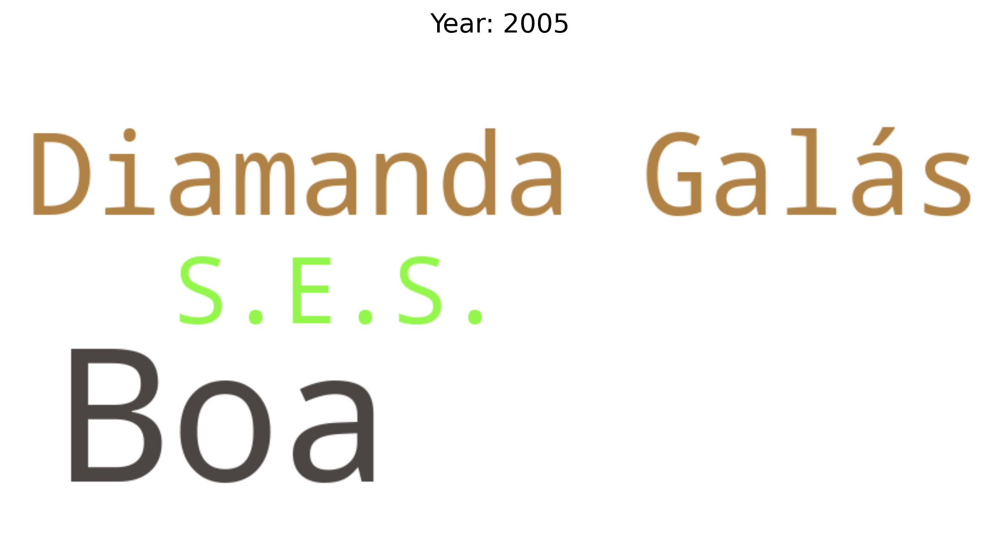

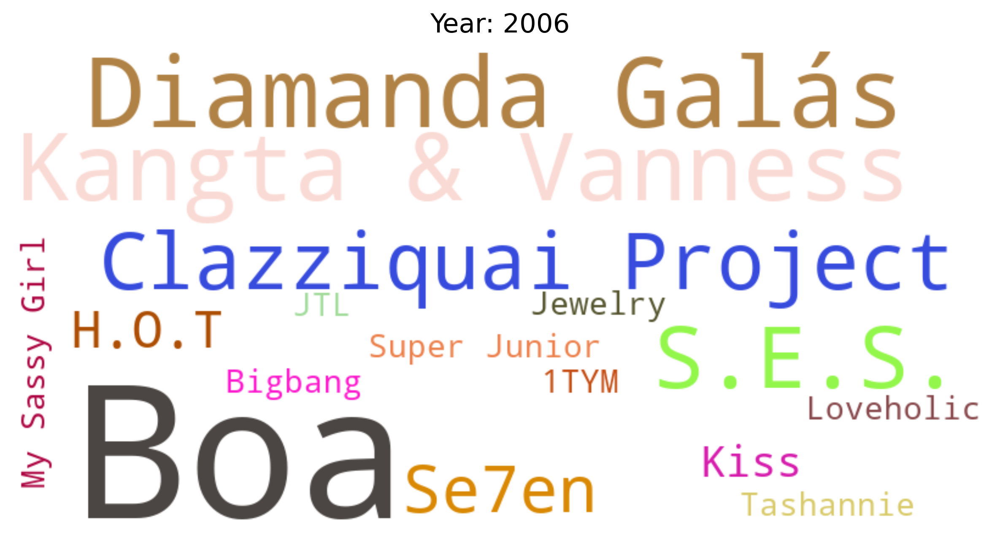

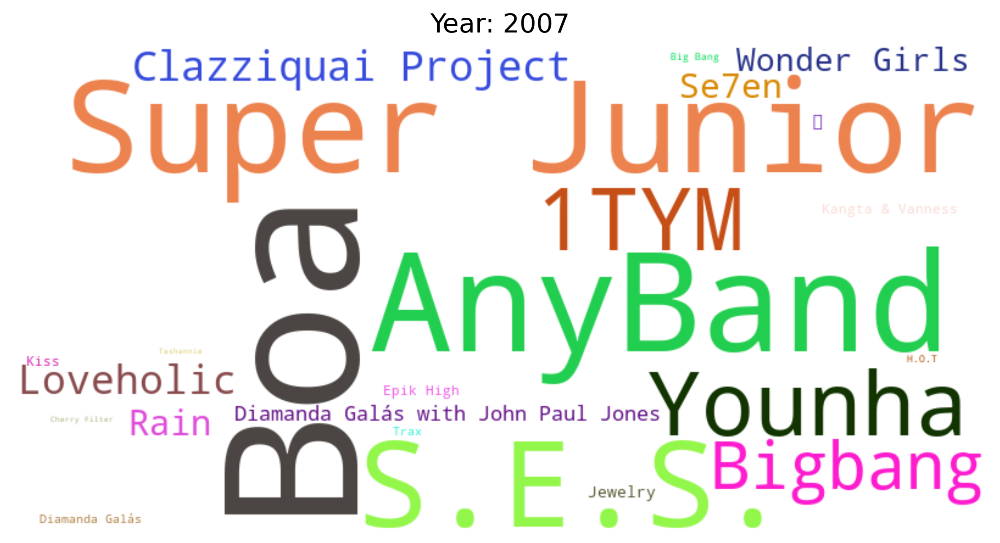

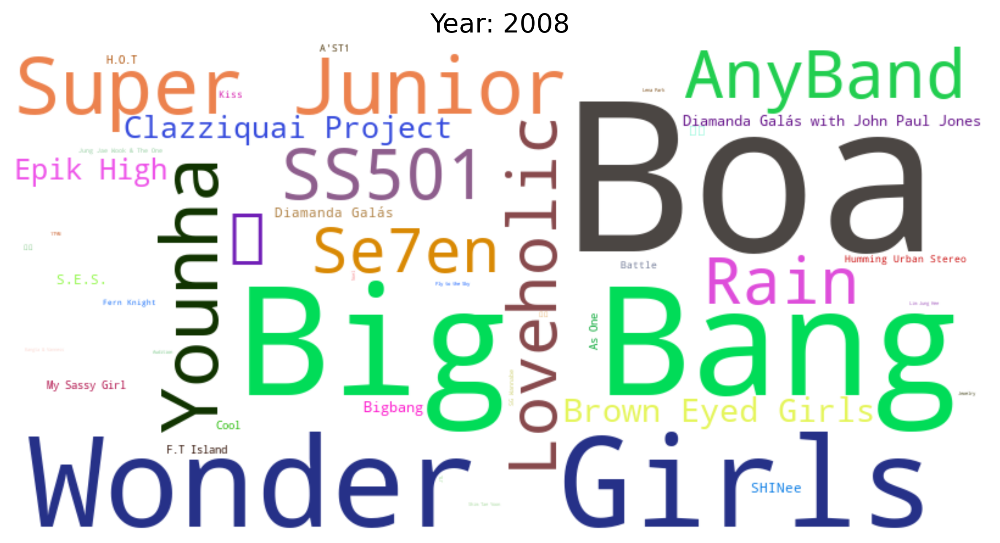

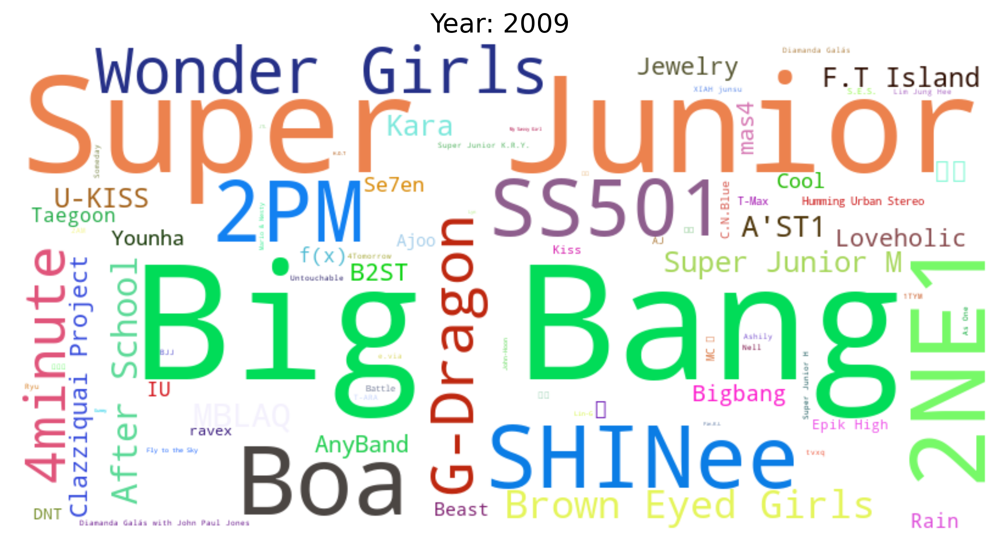

...

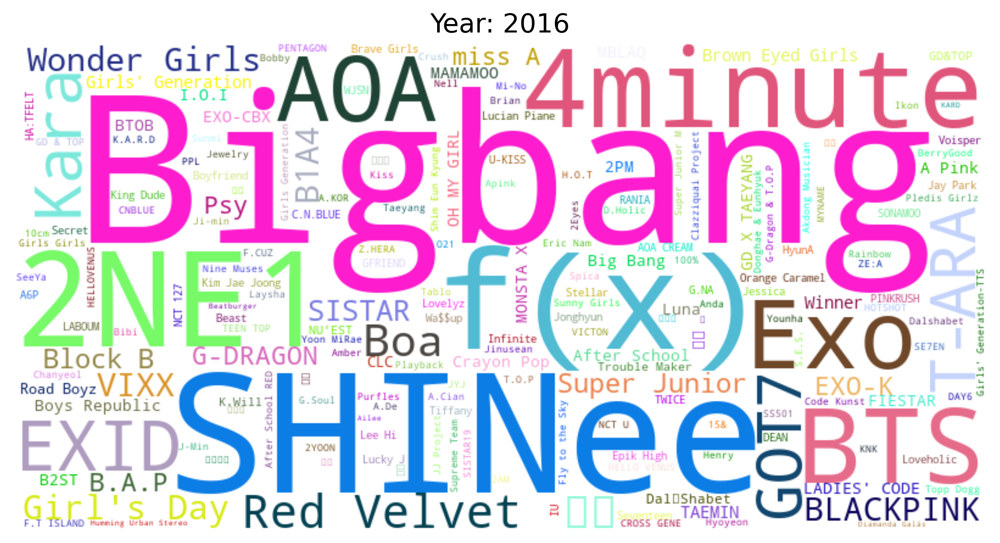

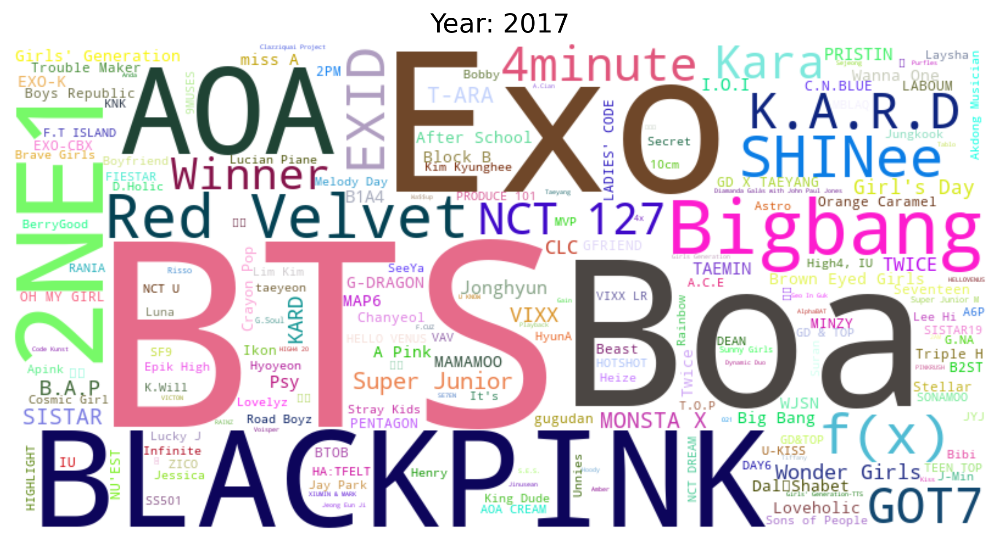

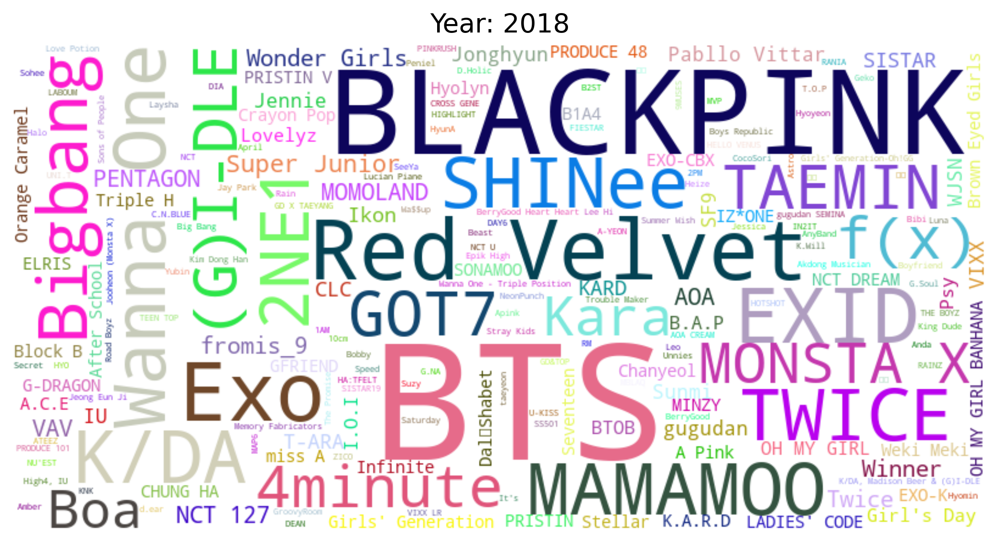

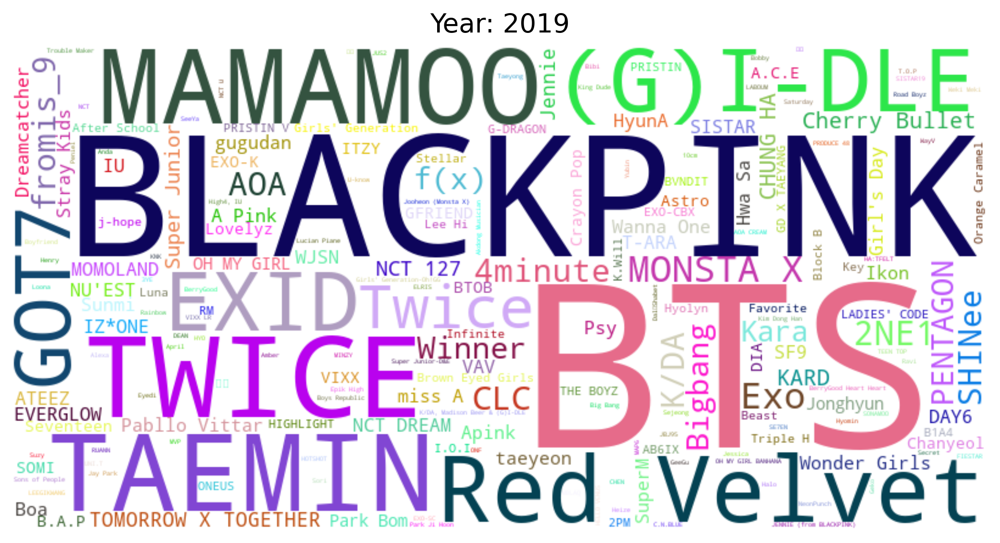

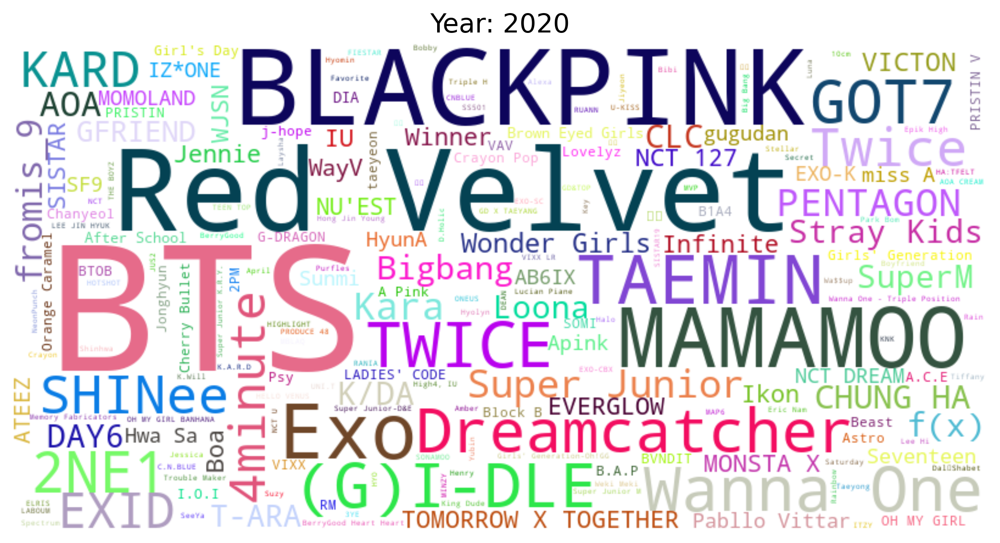

In [9]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import scienceplots  # スタイル設定用
import hashlib

# グローバルなスタイル設定
plt.rcParams['figure.dpi'] = 300
plt.style.use(['nature'])
plt.rc('axes', titlesize=15, labelsize=15)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('legend', fontsize=13)

# アーティスト名から決定的な色を生成する関数
def get_color(artist):
    h = hashlib.md5(artist.encode('utf-8')).hexdigest()[:6]
    return f"#{h}"

# df_kpop 内の全アーティストに対してグローバルなカラー割り当てを作成
global_color_mapping = {artist: get_color(artist) for artist in df_kpop['artist'].unique()}

# WordCloud で使用するカスタムカラー関数
def my_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return global_color_mapping.get(word, "#000000")  # マッピングに無い場合は黒

# 各年度のワードクラウドを作成して、PDFファイルとして保存
for year in years:
    # 対象年度のアーティスト名リストを取得して出現頻度を計算
    artists = df_kpop[df_kpop['year'] == year]['artist'].tolist()
    freq = Counter(artists)
    
    # WordCloud の生成（カスタムカラー関数を指定）
    wordcloud = WordCloud(width=800, height=400,
                          background_color='white',
                          color_func=my_color_func)\
                .generate_from_frequencies(freq)
    
    # 新たな図と軸を作成してプロット
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"Year: {year}")
    
    # 個別のPDFファイルとして保存
    # plt.savefig(f"worldcloud_{year}_r2.pdf", dpi=300, bbox_inches='tight')
    plt.show()
    # plt.close(fig)
